In [33]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
import tensorflow as tf
from keras import layers
from keras import Sequential, Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.optimizers import RMSprop
from sklearn.utils import class_weight
import plotly.graph_objects as go
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

### Задание 1. Анализ и обработка набора входных и выходных данных

Набор данных для обучения модели представляет собой CSV-файл, содержащий порядка 1.8 миллиона записей. Этот набор данных следует преобразовать для повышения качества и эффективности обучения\
Из полученного набора следует выделить обучающую выборку и проверочную выборку (в соотношении 9:1)

Для начала посмотрим на данные, которые нам даны

In [34]:
data = pd.read_csv('practice_dataframe.csv')
data

,type,X,Y,Z,VX,VY,VZ,epr,gamma
0,1,1.554476e+06,214.893048,1.631227e+06,-1692.708976,2977.723648,-1615.410939,0.004877,0.000099
1,1,1.554608e+06,218.864971,1.631127e+06,-1688.505870,2977.769328,-1618.479842,0.003315,0.000100
2,1,1.554711e+06,226.667004,1.630971e+06,-1684.383842,2977.899839,-1624.447963,0.005388,0.000103
3,9,1.554857e+06,323.443276,1.631129e+06,-1678.289665,2984.139289,-1617.698735,2.769067,0.005750
4,5,1.552572e+06,2932.028210,1.629375e+06,-1700.215149,2963.581705,-1624.307104,14.352422,0.006256
...,...,...,...,...,...,...,...,...,...
1750505,9,4.154002e+04,21341.693652,-7.378584e+04,-494.317823,-393.506786,180.029619,1.075414,0.005655
1750506,5,4.599614e+04,17191.479400,-6.592867e+04,-101.847665,-172.525348,37.898186,16.099871,0.006128
1750507,9,4.144235e+04,21263.754522,-7.375027e+04,-482.413906,-385.930201,175.696334,1.144812,0.006151
1750508,5,4.597592e+04,17157.028547,-6.592115e+04,-100.403079,-171.984749,37.371606,15.956397,0.005886


In [35]:
data.dtypes

type       int64
X        float64
Y        float64
Z        float64
VX       float64
VY       float64
VZ       float64
epr      float64
gamma    float64
dtype: object

Посмотрим на наличие в наших данных пропусков и дубликатов

In [36]:
cnt = data.isnull().sum()[data.isnull().sum() > 0]
cnt1 = data.duplicated().sum()
print(f'Количество пропусков: {cnt}\nКоличество дубликатов: {cnt1}')

Количество пропусков: Series([], dtype: int64)
Количество дубликатов: 0


Соответсвенно, предоставленный набор данных довольно чист. Теперь посмотрим, что из себя представляет местная система координат:

In [37]:
max_X = data['X'].max()
max_Y = data['Y'].max()
max_Z = data['Z'].max()

min_X = data['X'].min()
min_Y = data['Y'].min()
min_Z = data['Z'].min()
print(f'Максимальное и минимальное значение в\nX = {min_X}, {max_X};\nY = {min_Y}, {max_Y};\nZ = {min_Z}, {max_Z} ')

Максимальное и минимальное значение в
X = -3884409.083162, 3149297.495951;
Y = 0.134355, 1406093.554494;
Z = -2427642.907791, 4284285.216016 


Т.к. радиус Земли равен **6371000 м**, то можно сделть вывод, что систем отсчет начинается не с цента Земли, а из какой-то точки, где находится радиотехнический узел. Следовательно, за высоту можно принять координату **Y**, т.к. она единственная не принимает отрицательных значений, а дальность до объекта **R** надем как расстояние между точками в пространстве(примем, что радиотехнический узел имеет коррдинаты (0, 0, 0) :
$$ R = \sqrt{X^2 + Y^2 + Z^2} $$
Модуль скорости найдем аналогичным способом:
$$ V = \sqrt{V_x^2 + V_y^2 + V_z^2} $$

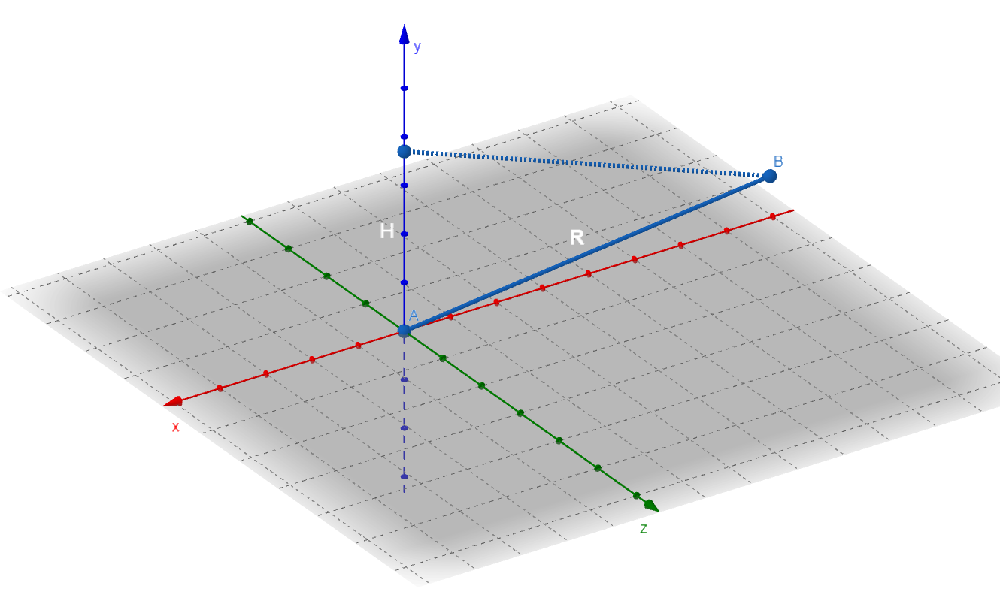

In [38]:
data['H'] = data['Y']
data['R'] = np.sqrt(data['X']**2 + data['Y']**2 + data['Z']**2)
data['V'] = np.sqrt(data['VX']**2 + data['VY']**2 + data['VZ']**2)
data

,type,X,Y,Z,VX,VY,VZ,epr,gamma,H,R,V
0,1,1.554476e+06,214.893048,1.631227e+06,-1692.708976,2977.723648,-1615.410939,0.004877,0.000099,214.893048,2.253286e+06,3787.037669
1,1,1.554608e+06,218.864971,1.631127e+06,-1688.505870,2977.769328,-1618.479842,0.003315,0.000100,218.864971,2.253305e+06,3786.507526
2,1,1.554711e+06,226.667004,1.630971e+06,-1684.383842,2977.899839,-1624.447963,0.005388,0.000103,226.667004,2.253262e+06,3787.329872
3,9,1.554857e+06,323.443276,1.631129e+06,-1678.289665,2984.139289,-1617.698735,2.769067,0.005750,323.443276,2.253478e+06,3786.646629
4,5,1.552572e+06,2932.028210,1.629375e+06,-1700.215149,2963.581705,-1624.307104,14.352422,0.006256,2932.028210,2.250633e+06,3783.110049
...,...,...,...,...,...,...,...,...,...,...,...,...
1750505,9,4.154002e+04,21341.693652,-7.378584e+04,-494.317823,-393.506786,180.029619,1.075414,0.005655,21341.693652,8.732348e+04,656.969074
1750506,5,4.599614e+04,17191.479400,-6.592867e+04,-101.847665,-172.525348,37.898186,16.099871,0.006128,17191.479400,8.220573e+04,203.897560
1750507,9,4.144235e+04,21263.754522,-7.375027e+04,-482.413906,-385.930201,175.696334,1.144812,0.006151,21263.754522,8.722796e+04,642.288485
1750508,5,4.597592e+04,17157.028547,-6.592115e+04,-100.403079,-171.984749,37.371606,15.956397,0.005886,17157.028547,8.218118e+04,202.623220


Проведем логарифмирование ЭПР-а и баллистического коэффициента и нормализацию относительно математического ожидания равного 0 всех переменных:

In [39]:
data['epr'] = np.log(data['epr'])
data['gamma'] = np.log(data['gamma'])
data[['H', 'R', 'V', 'epr', 'gamma']] -= data[['H', 'R', 'V', 'epr', 'gamma']].mean()
data[['H', 'R', 'V', 'epr', 'gamma']] /= data[['H', 'R', 'V', 'epr', 'gamma']].std()

In [40]:
data

,type,X,Y,Z,VX,VY,VZ,epr,gamma,H,R,V
0,1,1.554476e+06,214.893048,1.631227e+06,-1692.708976,2977.723648,-1615.410939,-0.839188,-0.981284,-1.494991,1.344896,0.029870
1,1,1.554608e+06,218.864971,1.631127e+06,-1688.505870,2977.769328,-1618.479842,-0.955750,-0.978117,-1.494971,1.344917,0.029437
2,1,1.554711e+06,226.667004,1.630971e+06,-1684.383842,2977.899839,-1624.447963,-0.809103,-0.972420,-1.494933,1.344869,0.030109
3,9,1.554857e+06,323.443276,1.631129e+06,-1678.289665,2984.139289,-1617.698735,1.075788,0.065708,-1.494458,1.345110,0.029550
4,5,1.552572e+06,2932.028210,1.629375e+06,-1700.215149,2963.581705,-1624.307104,1.572642,0.087455,-1.481647,1.341933,0.026660
...,...,...,...,...,...,...,...,...,...,...,...,...
1750505,9,4.154002e+04,21341.693652,-7.378584e+04,-494.317823,-393.506786,180.029619,0.790189,0.061419,-1.391235,-1.073993,-2.527928
1750506,5,4.599614e+04,17191.479400,-6.592867e+04,-101.847665,-172.525348,37.898186,1.607335,0.082159,-1.411617,-1.079709,-2.898164
1750507,9,4.144235e+04,21263.754522,-7.375027e+04,-482.413906,-385.930201,175.696334,0.809072,0.083111,-1.391618,-1.074100,-2.539924
1750508,5,4.597592e+04,17157.028547,-6.592115e+04,-100.403079,-171.984749,37.371606,1.604632,0.071772,-1.411786,-1.079736,-2.899206


Приведем категориальную переменную *type* к вектору при помощи прямого кодирования (one hot encoding)


In [41]:
encoder = OneHotEncoder(sparse=False)
y_encoded = encoder.fit_transform(data[['type']])

Проверим наши классы на сбалансированность:

In [42]:
class_counts = data['type'].value_counts()
print("Распределение классов:")
print(class_counts)

Распределение классов:
type
1     771843
3     259984
10    253510
5     220622
9     190155
6      54396
Name: count, dtype: int64


Как можно заметить, классы у нас не сбалансированы. Дабы избежать смещения модели и чтобы снизить риск переобучения, используем методы балансировки классов:
1. Стратификацию
2. Взвешивание классов во время обучения модели

In [43]:
X = data[['H', 'R', 'V', 'epr', 'gamma']]
y = y_encoded

In [44]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.1, random_state=42, stratify = y)

In [45]:
class_weights = class_weight.compute_class_weight(class_weight='balanced', classes=np.unique(data['type']), y=data['type'])
class_weights = {i: class_weights[i] for i in range(len(class_weights))}

### Задание 2-3.	Разработка архитектуры модели нейронной сети.
Предлагается использовать модель c полносвязными слоями, функцией активации relu в промежуточных слоях и функцией softmax в выходном слое. В качестве оптимизатора предлагается использовать rmsprop, функция потерь categorical_crossentropy. Подбор количества промежуточных слоёв в модели, количества нейронов в каждом слое, размера пакета и прочих гиперпараметров для улучшения характеристик обучения модели – величина функции потерь (loss) и точность (accuracy).


Чтобы избежать переобучения, добавим в модель Dropout с параметром  0.5

In [46]:
def build_model():
    model = Sequential()
    model.add(Dense(128, activation='relu', input_dim=X_train.shape[1], kernel_regularizer='l2'))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation='relu', kernel_regularizer='l2'))
    model.add(Dropout(0.5))
    model.add(Dense(y_train.shape[1], activation='softmax'))

    model.compile(optimizer=RMSprop(learning_rate=0.0005),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

Добавим *EarlyStopping* для остановки обучения, если валидационные потери не улучшаются в течение 10 эпох

In [47]:
model = build_model()
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [48]:
history = model.fit(X_train, y_train,
                    epochs=50,
                    batch_size=256,
                    validation_data=(X_val, y_val),
                    shuffle=True,
                    class_weight=class_weights,
                    callbacks=[early_stopping])

Epoch 1/50
6155/6155 [==============================] - 30s 5ms/step - loss: 0.3479 - accuracy: 0.9498 - val_loss: 0.1416 - val_accuracy: 0.9797
Epoch 2/50
6155/6155 [==============================] - 29s 5ms/step - loss: 0.1822 - accuracy: 0.9729 - val_loss: 0.1160 - val_accuracy: 0.9814
Epoch 3/50
6155/6155 [==============================] - 28s 5ms/step - loss: 0.1614 - accuracy: 0.9749 - val_loss: 0.1065 - val_accuracy: 0.9809
Epoch 4/50
6155/6155 [==============================] - 27s 4ms/step - loss: 0.1517 - accuracy: 0.9756 - val_loss: 0.1003 - val_accuracy: 0.9814
Epoch 5/50
6155/6155 [==============================] - 28s 5ms/step - loss: 0.1452 - accuracy: 0.9761 - val_loss: 0.0959 - val_accuracy: 0.9820
Epoch 6/50
6155/6155 [==============================] - 30s 5ms/step - loss: 0.1409 - accuracy: 0.9764 - val_loss: 0.0934 - val_accuracy: 0.9819
Epoch 7/50
6155/6155 [==============================] - 28s 5ms/step - loss: 0.1373 - accuracy: 0.9767 - val_loss: 0.0919 - val_ac

### Задание 4.
Оценить и визуализировать результаты обучения (кривая обучения по функции потерь и точности)

In [49]:
def plot_history(history):
    epochs = list(range(1, len(history.history['loss']) + 1))

    fig = go.Figure()

    fig.add_trace(go.Scatter(x=epochs, y=history.history['loss'],
                             mode='lines+markers',
                             name='Потери на этапе обучения'))

    fig.add_trace(go.Scatter(x=epochs, y=history.history['val_loss'],
                             mode='lines+markers',
                             name='Потери на этапе проверки'))

    fig.update_layout(title='Потери на этапах обучения и проверки',
                      xaxis_title='Эпохи',
                      yaxis_title='Потери',
                      template='plotly_dark')

    fig.show()

    fig = go.Figure()

    fig.add_trace(go.Scatter(x=epochs, y=history.history['accuracy'],
                             mode='lines+markers',
                             name='Точность на этапе обучения'))

    fig.add_trace(go.Scatter(x=epochs, y=history.history['val_accuracy'],
                             mode='lines+markers',
                             name='Точность на этапе проверки'))

    fig.update_layout(title='Точность на этапах обучения и проверки',
                      xaxis_title='Эпохи',
                      yaxis_title='Точность',
                      template='plotly_dark')

    fig.show()

In [50]:
plot_history(history)

Из графиков видно, что на этапе обучения потери снижаются с каждой эпохой, а точность растет. Кривые точности и потерь на этапе обучения близки к аналогичным кривым на этапе проверки. Проверим теперь нашу модель на проверочной выборке

In [51]:
test_loss, test_accuracy = model.evaluate(X_val, y_val)
print(f'Потери на проверочной выборке: {test_loss}')
print(f'Точность на проверочной выборке: {test_accuracy}')

5471/5471 [==============================] - 10s 2ms/step - loss: 0.0768 - accuracy: 0.9800
Потери на проверочной выборке: 0.0768480896949768
Точность на проверочной выборке: 0.9800058007240295


Следовательно, можно сделать вывод, что модель очень хорошо себя показывает

In [52]:
model.save('ballistic_object_model.h5')

### Задание 5.
Разработать автокодировщик для предоставленного набора данных и визуализировать его внутреннее представление (количество нейронов во внутреннем слое выбрать равным 2).

In [53]:
def create_autoencoder(input_dim):
    input_layer = Input(shape=(input_dim,))
    encoded = Dense(64, activation='relu')(input_layer)
    encoded = Dense(32, activation='relu')(encoded)
    encoded = Dense(16, activation='relu')(encoded)
    encoded = Dense(2, activation='relu')(encoded)  # количество нейронов во внутреннем слое выбрать равным 2

    decoded = Dense(16, activation='relu')(encoded)
    decoded = Dense(32, activation='relu')(decoded)
    decoded = Dense(64, activation='relu')(decoded)
    output_layer = Dense(input_dim, activation='linear')(decoded)

    autoencoder = Model(input_layer, output_layer)
    encoder = Model(input_layer, encoded)

    autoencoder.compile(optimizer='adam', loss='mse')

    return autoencoder, encoder

In [54]:
autoencoder, encoder = create_autoencoder(X_train.shape[1])

In [55]:
early_stopping_autoencoder = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [56]:
autoencoder.fit(X_train, X_train, epochs=500, batch_size=256, validation_split=0.1, callbacks=[early_stopping_autoencoder])

Epoch 1/500
5539/5539 [==============================] - 20s 3ms/step - loss: 0.0776 - val_loss: 0.0372
Epoch 2/500
5539/5539 [==============================] - 19s 3ms/step - loss: 0.0303 - val_loss: 0.0286
Epoch 3/500
5539/5539 [==============================] - 19s 3ms/step - loss: 0.0245 - val_loss: 0.0221
Epoch 4/500
5539/5539 [==============================] - 18s 3ms/step - loss: 0.0212 - val_loss: 0.0190
Epoch 5/500
5539/5539 [==============================] - 18s 3ms/step - loss: 0.0194 - val_loss: 0.0175
Epoch 6/500
5539/5539 [==============================] - 18s 3ms/step - loss: 0.0173 - val_loss: 0.0170
Epoch 7/500
5539/5539 [==============================] - 19s 3ms/step - loss: 0.0166 - val_loss: 0.0164
Epoch 8/500
5539/5539 [==============================] - 18s 3ms/step - loss: 0.0158 - val_loss: 0.0147
Epoch 9/500
5539/5539 [==============================] - 19s 3ms/step - loss: 0.0149 - val_loss: 0.0149
Epoch 10/500
5539/5539 [==============================] - 18s 3m

In [57]:
encoded_X_train = encoder.predict(X_train)

49234/49234 [==============================] - 79s 2ms/step


In [58]:
encoded_X_train_df = pd.DataFrame(encoded_X_train, columns=['Encoded Feature 1', 'Encoded Feature 2'])
encoded_X_train_df['Type'] = np.argmax(y_train, axis=1)

In [59]:
fig = px.scatter(encoded_X_train_df[:500000], x='Encoded Feature 1', y='Encoded Feature 2', color='Type', title='Классы на 2D-плоскости', symbol='Type')
fig.show()